In [1]:
import os
# import modin.pandas as pd
import pandas as pd
# import ray
import numpy as np
import j_utils.munging as mg
from tqdm.notebook import tqdm
import j_utils

# Download the data for 2014 and 2015

In [3]:
# import requests
from multiprocessing.dummy import Pool # use threads for I/O bound tasks
from urllib.request import urlretrieve
import os

dpath = 'data'
csv_path = os.path.join(dpath, 'csvs')

def custom_retrieve(url):
    urlretrieve(url, filename = os.path.join(csv_path, url.split('/')[-1]))

urls = [
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-01.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-02.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-03.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-04.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-05.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-06.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-07.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-08.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-09.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-10.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-11.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-12.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-01.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-02.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-03.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-04.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-05.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-06.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-07.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-08.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-09.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-10.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-11.csv',
    'https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2014-12.csv',
   ]
result = Pool(8).map(custom_retrieve, urls[::-1]) # download 4 files at a time

# load data, run latlng conversion, and save to feather

In [24]:
# import modin.pandas as pd
import pandas as pd
import numpy as np
import os
from tqdm.notebook import tqdm

dpath = 'data'
csv_fnames = sorted([f for f in os.listdir(dpath+'/csvs') if 'csv' in f])

# just do 2015
csv_fnames = csv_fnames[12:]

def latlng_to_meters(df, lat_name, lng_name):
    '''
    Helper function used by datashader example to prepare the data
    '''
    lat = df[lat_name]
    lng = df[lng_name]
    origin_shift = 2 * np.pi * 6378137 / 2.0
    mx = lng * origin_shift / 180.0
    my = np.log(np.tan((90 + lat) * np.pi / 360.0)) / (np.pi / 180.0)
    my = my * origin_shift / 180.0
    df.loc[:, lng_name.split('_')[0]+'_x'] = mx
    df.loc[:, lat_name.split('_')[0]+'_y'] = my

# try multi parts since everything at once is too big
to_concat = []
for f in tqdm(csv_fnames):
    df = pd.read_csv(os.path.join(dpath, 'csvs', f))
    df.columns = df.columns.str.strip()
    try:
        # for 2015
        df.rename({'tpep_pickup_datetime': 'pickup_datetime', 'tpep_dropoff_datetime': 'dropoff_datetime'}, axis=1, inplace=True)
    except:
        pass
    
    df.pickup_datetime = pd.to_datetime(df.pickup_datetime)
    df.dropoff_datetime = pd.to_datetime(df.dropoff_datetime)
    print(f)
    print('Filtering Taxi Data')
    df = df.loc[(df.pickup_longitude < -73.75) &
                (df.pickup_longitude > -74.15) &
                (df.dropoff_longitude < -73.75) &
                (df.dropoff_longitude > -74.15) &
                (df.pickup_latitude > 40.68) &
                (df.pickup_latitude < 40.84) &
                (df.dropoff_latitude > 40.68) &
                (df.dropoff_latitude < 40.84)].copy()
    
    print('Reprojecting Taxi Data')
    latlng_to_meters(df, 'pickup_latitude', 'pickup_longitude')
    latlng_to_meters(df, 'dropoff_latitude', 'dropoff_longitude')
    df['pickup_hour'] = df.pickup_datetime.dt.hour
    df['dropoff_hour'] = df.dropoff_datetime.dt.hour
    # not supported yet in feather.
#     df['ride_duration'] = df.dropoff_datetime - df.pickup_datetime
    
    # save out
    df.reset_index(drop=True).to_feather(os.path.join(dpath, f[:-3] + 'fth'))
    to_concat.append(df)

yellow_tripdata_2015-01.csv
Filtering Taxi Data
Reprojecting Taxi Data


/home/justin/anaconda3/envs/all_ds/lib/python3.7/site-packages/pyarrow/feather.py:85: FutureWarning: The SparseDataFrame class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  if isinstance(df, _pandas_api.pd.SparseDataFrame):


yellow_tripdata_2015-02.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-03.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-04.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-05.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-06.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-07.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-08.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-09.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-10.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-11.csv
Filtering Taxi Data
Reprojecting Taxi Data
yellow_tripdata_2015-12.csv
Filtering Taxi Data
Reprojecting Taxi Data



# Making the app

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
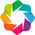

In [2]:
import os
import numpy as np
import pandas as pd
import panel as pn
import holoviews as hv, param
import panel as pn
from colorcet import cm
from holoviews.operation.datashader import rasterize, shade
from holoviews import streams
from holoviews.element.tiles import StamenTerrain
import dask
import dask.dataframe as dd
import feather
from holoviews import opts  # noqa
import gc

pn.extension('katex')
hv.extension('bokeh')

In [8]:
# Constants and setup
cmaps = ['bgyw','fire','bgy','bmy','gray','kbc']
disp_cols = ['fare_amount', 'tip_amount', 'trip_distance', 'pickup_datetime', 'dropoff_datetime']
m_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April',
          5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September',
          10: 'October', 11: 'November', 12: 'December'}
opts = dict(width=500,height=400,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)

dpath = 'data'
fth_fnames = sorted([f for f in os.listdir(dpath) if 'fth' in f])
fnames_2014 = fth_fnames[:12]
fnames_2015 = fth_fnames[12:]
# lazy_2014 = [dask.delayed(feather.read_dataframe)(os.path.join(dpath,f)) for f in fnames_2014]
# lazy_2015 = [dask.delayed(feather.read_dataframe)(os.path.join(dpath,f)) for f in fnames_2015]
# all_df_2014 = dd.from_delayed(lazy_2014).persist()
# all_df_2015 = dd.from_delayed(lazy_2015).persist()
df_2014 = None
df_2015 = None


# Panel choice components
## data choices
month_slider = pn.widgets.IntSlider(name='Month', start=1, end=12, value=1, callback_policy='mouseup')
trip_dist = pn.widgets.RangeSlider(name='Trip Distance (Miles)', start=0, end=100, value=(0,10), step=1, callback_policy='mouseup')
tip_amt = pn.widgets.RangeSlider(name='Tip Amount ($)', start=0, end=500, value=(0,20), step=5, callback_policy='mouseup')
## map choices
cmap = pn.widgets.Select(name='Color Map', options={c:cm[c] for c in cmaps})
location = pn.widgets.Select(name='Location', options=['pickup', 'dropoff'])
alpha = pn.widgets.FloatSlider(name = 'Alpha', start=0., end=1., step=.05, value=.7, callback_policy='mouseup')

# Df selecting
@pn.depends(month_slider.param.value) #, trip_dist.param.value, tip_amt.param.value
def set_df(month): #, trip_dist, tip_amt
    global df_2014
    global df_2015 
    df_2014 = pd.read_feather(os.path.join(dpath, fnames_2014[month-1]))
    df_2015 = pd.read_feather(os.path.join(dpath, fnames_2015[month-1]))
    gc.collect()
#     df_2014 = df_2014.query(f'trip_distance >= {trip_dist[0]} and trip_distance <= {trip_dist[1]}')
#     df_2015 = df_2015.query(f'trip_distance >= {trip_dist[0]} and trip_distance <= {trip_dist[1]}')
#     df_2014 = df_2014.query(f'tip_amount >= {tip_amt[0]} and tip_amount <= {tip_amt[1]}')
#     df_2015 = df_2015.query(f'tip_amount >= {tip_amt[0]} and tip_amount <= {tip_amt[1]}')
    
# initialize some data
set_df(1) #, (0,100), (0,1000)
gc.collect()

# Panel app components
## Title
@pn.depends(month_slider.param.value) #, trip_dist.param.value, tip_amt.param.value
def title_fn(month): #, trip_dist, tip_amt
    gc.collect()
    return '## {:,}/{:,} New York City TLC-tracked Taxi Rides in {} 2014/2015'.format(df_2014.shape[0], df_2015.shape[0], m_dict[month])

## Df heads to display
@pn.depends(month_slider.param.value, trip_dist.param.value, tip_amt.param.value)
def df_fn(month, trip_dist, tip_amt):
#     print(trip_dist, tip_amt)
    sub_df_2014 = df_2014.query(f'trip_distance >= {trip_dist[0]} and trip_distance <= {trip_dist[1]}')
    sub_df_2015 = df_2015.query(f'trip_distance >= {trip_dist[0]} and trip_distance <= {trip_dist[1]}')
    sub_df_2014 = sub_df_2014.query(f'tip_amount >= {tip_amt[0]} and tip_amount <= {tip_amt[1]}')
    sub_df_2015 = sub_df_2015.query(f'tip_amount >= {tip_amt[0]} and tip_amount <= {tip_amt[1]}')
    sub_df_2014 = sub_df_2014.sort_values('tip_amount', ascending=False).head()[disp_cols].reset_index(drop=True)
    sub_df_2015 = sub_df_2015.sort_values('tip_amount', ascending=False).head()[disp_cols].reset_index(drop=True)
#     print(sub_df_2014.shape, sub_df_2015.shape)
    pane_2014 = pn.pane.DataFrame(sub_df_2014, sizing_mode="stretch_width", width=850)
    pane_2015 = pn.pane.DataFrame(sub_df_2015, sizing_mode="stretch_width", width=850)
    gc.collect()
    return pn.Column("#### 2014 Highest Tipping Rides", pane_2014, "#### 2015 Highest Tipping Rides", pane_2015)
    
## 2014 and 2015 plots    
@pn.depends(month_slider.param.value, location.param.value, cmap.param.value, alpha.param.value, trip_dist.param.value, tip_amt.param.value)
def plot_fn_2014(month, location, cmap, alpha, trip_dist, tip_amt):
    points = hv.Points(df_2014, kdims=[location+'_x', location+'_y'], vdims=['trip_distance', 'tip_amount'])
    points = hv.DynamicMap(points)
    points = points.select(trip_distance=trip_dist)
    points = points.select(tip_amount=tip_amt)
    tiles = StamenTerrain().apply.opts(alpha=alpha, **opts)
    agg = rasterize(points, x_sampling=1, y_sampling=1, width=600, height=400)
    gc.collect()
    return tiles * shade(agg, cmap=cmap)

@pn.depends(month_slider.param.value, location.param.value, cmap.param.value, alpha.param.value, trip_dist.param.value, tip_amt.param.value)
def plot_fn_2015(month, location, cmap, alpha, trip_dist, tip_amt):
    points = hv.Points(df_2015, kdims=[location+'_x', location+'_y'], vdims=['trip_distance', 'tip_amount'])
    points = hv.DynamicMap(points)
    points = points.select(trip_distance=trip_dist)
    points = points.select(tip_amount=tip_amt)
    tiles = StamenTerrain().apply.opts(alpha=alpha, **opts)
    agg = rasterize(points, x_sampling=1, y_sampling=1, width=600, height=400)
    gc.collect()
    return tiles * shade(agg, cmap=cmap)

# Creating the app
title = pn.Row(title_fn, sizing_mode='stretch_width', width = 1000)
left_params = pn.Column(month_slider, trip_dist, tip_amt,)
right_params = pn.Column(alpha, cmap, location, set_df) 
all_params = pn.Row(left_params, right_params)
map_2014 = pn.Column('#### 2014', plot_fn_2014)
map_2015 = pn.Column('#### 2015', plot_fn_2015)
body = pn.Row(map_2014, map_2015)
df_panes = pn.Row(df_fn)
app = pn.Column(title, all_params, body, df_panes, width=1000).servable()
app

Column(width=1000)
    [0] Row(sizing_mode='stretch_width', width=1000)
        [0] ParamFunction(function)
    [1] Row
        [0] Column
            [0] IntSlider(callback_policy='mouseup', end=12, name='Month', start=1, value=1)
            [1] RangeSlider(callback_policy='mouseup', end=100, name='Trip Distance (Miles)', step=1, value=(0, 10))
            [2] RangeSlider(callback_policy='mouseup', end=500, name='Tip Amount ($)', step=5, value=(0, 20))
        [1] Column
            [0] FloatSlider(callback_policy='mouseup', name='Alpha', step=0.05, value=0.7)
            [1] Select(name='Color Map', options={'bgyw': <matplotlib.color...}, value=<matplotlib.colors.LinearS...)
            [2] Select(name='Location', options=['pickup', 'dropoff'], value='pickup')
            [3] ParamFunction(function)
    [2] Row
        [0] Column
            [0] Markdown(str)
            [1] ParamFunction(function)
        [1] Column
            [0] Markdown(str)
            [1] ParamFunction(function)
    [3] Row
        [0] ParamFunction(function)

In [ ]:
bokeh.__version__
ex = bokeh.models.widgets.sliders.RangeSlider
ex.callback_policy??

# Try in a class setup

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
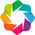

In [2]:
import os
import numpy as np
import pandas as pd
import panel as pn
import holoviews as hv, param
import panel as pn
from colorcet import cm
from holoviews.operation.datashader import rasterize, shade
from holoviews import streams
from holoviews.element.tiles import StamenTerrain
import dask
import dask.dataframe as dd
import feather
from holoviews import opts  # noqa
import gc

pn.extension('katex')
hv.extension('bokeh')

In [7]:
# Constants and setup
cmaps = ['bgyw','fire','bgy','bmy','gray','kbc']
disp_cols = ['fare_amount', 'tip_amount', 'trip_distance', 'pickup_datetime', 'dropoff_datetime']
m_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April',
          5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September',
          10: 'October', 11: 'November', 12: 'December'}
opts = dict(width=500,height=400,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)
dpath = 'data'
fth_fnames = sorted([f for f in os.listdir(dpath) if 'fth' in f])
fnames_2014 = fth_fnames[:12]
fnames_2015 = fth_fnames[12:]
df_2014 = pd.read_feather(os.path.join(dpath, fnames_2014[0]))
df_2015 = pd.read_feather(os.path.join(dpath, fnames_2015[0]))
month = None
trip_dis_bnd = (0,100)
tip_amt_bnd = (0, 200)
month_bnd = (1, 12)
hour_l = [i for i in range(24)]

class NYCTaxiExplorer(param.Parameterized):
    month      = param.Integer(1, bounds=(1, 12))
    trip_distance   = param.Range(default=(0, 30), bounds=trip_dis_bnd)    
    tip_amount    = param.Range(default=(0, 200), bounds=tip_amt_bnd)
    location   = param.ObjectSelector(default='dropoff', objects=['dropoff', 'pickup'])    
    alpha      = param.Magnitude(default=0.6, doc="Alpha value for the map opacity")
    cmap       = param.ObjectSelector(cm['fire'], objects={c:cm[c] for c in cmaps})
    hour       = param.List(hour_l)
    
    def load_dfs(self):
        global df_2014
        global df_2015
        global month
        month = self.month
        df_2014 = pd.read_feather(os.path.join(dpath, fnames_2014[self.month-1]))
        df_2015 = pd.read_feather(os.path.join(dpath, fnames_2015[self.month-1]))
    
    @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
    def trash_collect(self):
        gc.collect()
    
    @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
    def points_2014(self):
        global month
        if self.month != month:
            self.load_dfs()
        points_2014 = hv.Points(df_2014, kdims=[self.location+'_x', self.location+'_y'], vdims=['dropoff_hour', 'trip_distance', 'tip_amount'])
        if self.hour != hour_l: points_2014 = points_2014.select(dropoff_hour=self.hour)
        if self.trip_distance != trip_dis_bnd: points_2014 = points_2014.select(trip_distance=self.trip_distance)
        if self.tip_amount != tip_amt_bnd: points_2014 = points_2014.select(tip_amount=self.tip_amount)
        self.df_2014_shape = points_2014.data.shape
        return points_2014

    def view_2014(self,**kwargs):
        points_2014 = hv.DynamicMap(self.points_2014)
        tiles = StamenTerrain().apply.opts(alpha=self.param.alpha, **opts)
        agg = rasterize(points_2014, x_sampling=1, y_sampling=1, width=600, height=400)
        return tiles * shade(agg, cmap=self.param.cmap)
    
    @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
    def points_2015(self):
        global month
        if self.month != month:
            self.load_dfs()
        points_2015 = hv.Points(df_2015, kdims=[self.location+'_x', self.location+'_y'], vdims=['dropoff_hour', 'trip_distance', 'tip_amount'])
        if self.hour != (0, 24): points_2015 = points_2015.select(dropoff_hour=self.hour)
        if self.trip_distance != (0, 1000): points_2015 = points_2015.select(trip_distance=self.trip_distance)
        if self.tip_amount != (0, 1000): points_2015 = points_2015.select(tip_amount=self.tip_amount)
        self.df_2015_shape = points_2015.data.shape
        return points_2015

    def view_2015(self,**kwargs):
        points_2015 = hv.DynamicMap(self.points_2015)
        tiles = StamenTerrain().apply.opts(alpha=self.param.alpha, **opts)
        agg = rasterize(points_2015, x_sampling=1, y_sampling=1, width=600, height=400)
        return tiles * shade(agg, cmap=self.param.cmap)
    
    @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
    def title_2014(self):
        if not hasattr(self, 'df_2014_shape'): self.df_2014_shape = df_2014.shape
        return pn.pane.HTML('<h4>{:,} Taxi Rides in {} 2014</h4>'.format(self.df_2014_shape[0], m_dict[self.month]), width = 500)
    
    @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
    def title_2015(self):
        if not hasattr(self, 'df_2015_shape'): self.df_2015_shape = df_2015.shape
        return pn.pane.HTML('<h4>{:,} Taxi Rides in {} 2015</h4>'.format(self.df_2015_shape[0], m_dict[self.month]), width = 500)
    
    @param.depends('hour', 'month', 'trip_distance', 'tip_amount', watch=True)
    def disp_dfs(self):
        sdf_2014 = df_2014.query(f'trip_distance >= {self.trip_distance[0]} and trip_distance <= {self.trip_distance[1]}')
        sdf_2015 = df_2015.query(f'trip_distance >= {self.trip_distance[0]} and trip_distance <= {self.trip_distance[1]}')
        sdf_2014 = sdf_2014.query(f'tip_amount >= {self.tip_amount[0]} and tip_amount <= {self.tip_amount[1]}')
        sdf_2015 = sdf_2015.query(f'tip_amount >= {self.tip_amount[0]} and tip_amount <= {self.tip_amount[1]}')
        sdf_2014 = sdf_2014.sort_values('tip_amount', ascending=False).head()[disp_cols].reset_index(drop=True)
        sdf_2015 = sdf_2015.sort_values('tip_amount', ascending=False).head()[disp_cols].reset_index(drop=True)
        pane_2014 = pn.pane.DataFrame(sdf_2014, sizing_mode="stretch_width", width=850)
        pane_2015 = pn.pane.DataFrame(sdf_2015, sizing_mode="stretch_width", width=850)
        return pn.Column("#### 2014 Highest Tipping Rides", pane_2014, "#### 2015 Highest Tipping Rides", pane_2015)     

taxi = NYCTaxiExplorer(name="NYC Taxi Trips")
# Individual widgets from params
month_s = pn.Param(taxi.param.month, widgets = {
    'month': {'type': pn.widgets.IntSlider, 'callback_policy': 'mouseup', 'callback_throttle': 2000}
})
hour = pn.Param(taxi.param.hour, widgets = {
    'hour': {'type': pn.widgets.MultiSelect, 'value':taxi.param.hour.default, 'options':taxi.param.hour.default, 'size':12, 'callback_policy': 'mouseup', 'callback_throttle': 2000}
})
trip = pn.Param(taxi.param.trip_distance, widgets = {
    'trip_distance': {'type': pn.widgets.RangeSlider, 'callback_policy': 'mouseup', 'value_throttled': trip_dis_bnd, 'callback_throttle': 2000}
})
tip = pn.Param(taxi.param.tip_amount, widgets = {
    'tip_amount': {'type': pn.widgets.RangeSlider, 'callback_policy': 'mouseup', 'value_throttled': tip_amt_bnd, 'callback_throttle': 2000}
})
location = pn.Param(taxi.param.location)
alpha = map_2014 = pn.Param(taxi.param.alpha)
cmap = pn.Param(taxi.param.cmap)


# tab text
overv_HTML = pn.pane.HTML('', width = 850, sizing_mode='stretch_wdith')
motiv_HTML = pn.pane.HTML('After our Datashader assignment, I was curious to learn more about the HoloViz ecosystem that Datashader was a part of. I decided to look at more of the <a href="https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page">New York City Taxi & Limousine Commission (TLC)</a> data for two reasons. First, I wanted to see the capabilities of the HoloViz ecosystem to handle larger data. Second, I wondered if there were any trends identifiable due to the rise of ride sharing. Recent data from the TLC no longer includes latitude and longitude, so the app uses data from 2014-2015, which covers the period that Lyft started operating in NYC (late July 2014).', width = 850, sizing_mode='stretch_width') #
tabs = pn.Tabs((Overview, overv_HTML),("Motivations", motiv_HTML), ("Other thing", 'other thing stuff')) #, width = 850, sizing_mode = 'stretch_width'

# Data widgets and graph widgets
data_widgets = pn.Column(month_s, trip, tip)
graph_widgets = pn.Column(alpha, cmap, location)
widgets = pn.Row(data_widgets, hour, graph_widgets)

# Dataframes
disp_dfs = taxi.disp_dfs

# Map panels
map_2014 = pn.Column(taxi.title_2014, taxi.view_2014())
map_2015 = pn.Column(taxi.title_2015, taxi.view_2015())
maps = pn.Row(map_2014, map_2015)

gc.collect()
# Whole app
app = pn.Column(tabs, widgets, maps, disp_dfs).servable()
app

Column
    [0] Tabs
        [0] HTML(str, sizing_mode='stretch_width', width=850)
        [1] Markdown(str, name='Other thing')
    [1] Row
        [0] Column
            [0] Param(NYCTaxiExplorer, parameters=['month'], show_name=False, widgets={'month': {'callback_polic...})
            [1] Param(NYCTaxiExplorer, parameters=['trip_distance'], show_name=False, widgets={'trip_distance': {'callba...})
            [2] Param(NYCTaxiExplorer, parameters=['tip_amount'], show_name=False, widgets={'tip_amount': {'callback_...})
        [1] Param(NYCTaxiExplorer, parameters=['hour'], show_name=False, widgets={'hour': {'value': [0, ...})
        [2] Column
            [0] Param(NYCTaxiExplorer, parameters=['alpha'], show_name=False)
            [1] Param(NYCTaxiExplorer, parameters=['cmap'], show_name=False)
            [2] Param(NYCTaxiExplorer, parameters=['location'], show_name=False)
    [2] Row
        [0] Column
            [0] ParamMethod(method)
            [1] HoloViews(DynamicMap)
        [1] Column
            [0] ParamMethod(method)
            [1] HoloViews(DynamicMap)
    [3] ParamMethod(method)

In [12]:
motiv_HTML = 'hi'

In [13]:
tabs

Tabs(sizing_mode='stretch_width', width=850)
    [0] Markdown(str, name='Motivations')
    [1] Markdown(str, name='Other thing')

In [8]:
type(pn.Tabs)

param.parameterized.ParameterizedMetaclass

# Experimental

In [ ]:
# # Constants and setup
# cmaps = ['bgyw','fire','bgy','bmy','gray','kbc']
# disp_cols = ['fare_amount', 'tip_amount', 'trip_distance', 'pickup_datetime', 'dropoff_datetime']
# m_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April',
#           5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September',
#           10: 'October', 11: 'November', 12: 'December'}
# opts = dict(width=500,height=400,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)
# dpath = 'data'
# fth_fnames = sorted([f for f in os.listdir(dpath) if 'fth' in f])
# fnames_2014 = fth_fnames[:12]
# fnames_2015 = fth_fnames[12:]
# df_2014 = pd.read_feather(os.path.join(dpath, fnames_2014[0]))
# df_2015 = pd.read_feather(os.path.join(dpath, fnames_2015[0]))
# month = None
# trip_dis_bnd = (0,100)
# tip_amt_bnd = (0, 200)
# month_bnd = (1, 12)
# hour_l = [i for i in range(24)]

# class NYCTaxiExplorer(param.Parameterized):
#     def __init__(self, name):
#         self.trip_distance = trip_dis_bnd
#         super().__init__()
        
        
#     month      = param.Integer(1, bounds=(1, 12))
# #     trip_distance   = param.Range(default=(0, 5), bounds=trip_dis_bnd)
#     trip_distance_lower = param.Integer(0, bounds=trip_dis_bnd)
#     trip_distance_upper = param.Integer(2, bounds=trip_dis_bnd)
    
#     tip_amount    = param.Range(default=(0, 5), bounds=tip_amt_bnd)
#     location   = param.ObjectSelector(default='dropoff', objects=['dropoff', 'pickup'])    
#     alpha      = param.Magnitude(default=0.6, doc="Alpha value for the map opacity")
#     cmap       = param.ObjectSelector(cm['fire'], objects={c:cm[c] for c in cmaps})
#     hour       = param.List(hour_l)
    
#     def load_dfs(self):
#         global df_2014
#         global df_2015
#         global month
#         month = self.month
#         df_2014 = pd.read_feather(os.path.join(dpath, fnames_2014[self.month-1]))
#         df_2015 = pd.read_feather(os.path.join(dpath, fnames_2015[self.month-1]))
    
    
#     @param.depends('trip_distance_lower', 'trip_distance_upper')
#     def set_trip_distance(self):
#         self.trip_distance = (self.trip_distance_lower, self.trip_distance_upper)
    
#     @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
# #     @param.depends('location', 'hour', 'month', 'trip_distance_lower', 'trip_distance_upper', 'tip_amount', watch=True)
#     def trash_collect(self):
#         gc.collect()
    
# #     @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
#     @param.depends('location', 'hour', 'month', 'trip_distance_lower', 'trip_distance_upper', 'tip_amount', watch=True)
#     def points_2014(self):
#         global month
#         if self.month != month:
#             self.load_dfs()
#         points_2014 = hv.Points(df_2014, kdims=[self.location+'_x', self.location+'_y'], vdims=['dropoff_hour', 'trip_distance', 'tip_amount'])
#         if self.hour != hour_l: points_2014 = points_2014.select(dropoff_hour=self.hour)
#         if self.trip_distance != trip_dis_bnd: points_2014 = points_2014.select(trip_distance=self.trip_distance)
#         if self.tip_amount != tip_amt_bnd: points_2014 = points_2014.select(tip_amount=self.tip_amount)
#         self.df_2014_shape = points_2014.data.shape
#         return points_2014

#     def view_2014(self,**kwargs):
#         points_2014 = hv.DynamicMap(self.points_2014)
#         tiles = StamenTerrain().apply.opts(alpha=self.param.alpha, **opts)
#         agg = rasterize(points_2014, x_sampling=1, y_sampling=1, width=600, height=400)
#         return tiles * shade(agg, cmap=self.param.cmap)
    
#     @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
# #     @param.depends('location', 'hour', 'month', 'trip_distance_lower', 'trip_distance_upper', 'tip_amount', watch=True)
#     def points_2015(self):
#         global month
#         if self.month != month:
#             self.load_dfs()
#         points_2015 = hv.Points(df_2015, kdims=[self.location+'_x', self.location+'_y'], vdims=['dropoff_hour', 'trip_distance', 'tip_amount'])
# #         import ipdb; ipdb.set_trace()
#         if self.hour != (0, 24): points_2015 = points_2015.select(dropoff_hour=self.hour)
#         if self.trip_distance != (0, 1000): points_2015 = points_2015.select(trip_distance=self.trip_distance)
#         if self.tip_amount != (0, 1000): points_2015 = points_2015.select(tip_amount=self.tip_amount)
#         self.df_2015_shape = points_2015.data.shape
#         return points_2015

#     def view_2015(self,**kwargs):
#         points_2015 = hv.DynamicMap(self.points_2015)
#         tiles = StamenTerrain().apply.opts(alpha=self.param.alpha, **opts)
#         agg = rasterize(points_2015, x_sampling=1, y_sampling=1, width=600, height=400)
#         return tiles * shade(agg, cmap=self.param.cmap)
    
#     @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
# #     @param.depends('location', 'hour', 'month', 'trip_distance_lower', 'trip_distance_upper', 'tip_amount', watch=True)
#     def title_2014(self):
#         if not hasattr(self, 'df_2014_shape'): self.df_2014_shape = df_2014.shape
#         return '### {:,} Taxi Rides in {} 2014'.format(self.df_2014_shape[0], m_dict[self.month])
    
#     @param.depends('location', 'hour', 'month', 'trip_distance', 'tip_amount', watch=True)
# #     @param.depends('location', 'hour', 'month', 'trip_distance_lower', 'trip_distance_upper', 'tip_amount', watch=True)
#     def title_2015(self):
#         if not hasattr(self, 'df_2015_shape'): self.df_2015_shape = df_2015.shape
#         return '### {:,} Taxi Rides in {} 2015'.format(self.df_2015_shape[0], m_dict[self.month])
    
#     @param.depends('hour', 'month', 'trip_distance', 'tip_amount', watch=True)
# #     @param.depends('hour', 'month', 'trip_distance_lower', 'trip_distance_upper', 'tip_amount', watch=True)
#     def disp_dfs(self):
#         sdf_2014 = df_2014.query(f'trip_distance >= {self.trip_distance[0]} and trip_distance <= {self.trip_distance[1]}')
#         sdf_2015 = df_2015.query(f'trip_distance >= {self.trip_distance[0]} and trip_distance <= {self.trip_distance[1]}')
#         sdf_2014 = sdf_2014.query(f'tip_amount >= {self.tip_amount[0]} and tip_amount <= {self.tip_amount[1]}')
#         sdf_2015 = sdf_2015.query(f'tip_amount >= {self.tip_amount[0]} and tip_amount <= {self.tip_amount[1]}')
#         sdf_2014 = sdf_2014.sort_values('tip_amount', ascending=False).head()[disp_cols].reset_index(drop=True)
#         sdf_2015 = sdf_2015.sort_values('tip_amount', ascending=False).head()[disp_cols].reset_index(drop=True)
#         pane_2014 = pn.pane.DataFrame(sdf_2014, sizing_mode="stretch_width", width=850)
#         pane_2015 = pn.pane.DataFrame(sdf_2015, sizing_mode="stretch_width", width=850)
#         return pn.Column("#### 2014 Highest Tipping Rides", pane_2014, "#### 2015 Highest Tipping Rides", pane_2015)     

# taxi = NYCTaxiExplorer(name="NYC Taxi Trips")
# # do some initializing
# taxi.set_trip_distance()

# # Individual widgets from params
# month_s = pn.Param(taxi.param.month, widgets = {
#     'month': {'type': pn.widgets.IntSlider, 'callback_policy': 'mouseup', 'callback_throttle': 2000}
# })
# hour = pn.Param(taxi.param.hour, widgets = {
#     'hour': {'type': pn.widgets.MultiSelect, 'value':taxi.param.hour.default, 'options':taxi.param.hour.default, 'size':12, 'callback_policy': 'mouseup', 'callback_throttle': 2000}
# })
# trip_lower = pn.Param(taxi.param.trip_distance_lower)
# trip_upper = pn.Param(taxi.param.trip_distance_upper)
# tip = pn.Param(taxi.param.tip_amount, widgets = {
#     'tip_amount': {'type': pn.widgets.RangeSlider, 'callback_policy': 'mouseup', 'value_throttled': tip_amt_bnd, 'callback_throttle': 2000}
# })
# location = pn.Param(taxi.param.location)
# alpha = map_2014 = pn.Param(taxi.param.alpha)
# cmap = pn.Param(taxi.param.cmap)


# # tab text
# motiv_text = '''How do you do?
# My name is Justin?

# Is this a new thing?
# '''
# tabs = pn.Tabs(("Motivations", motiv_text), ("Other thing", 'other thing stuff'))

# # Data widgets and graph widgets
# data_widgets = pn.Column(month_s, trip_lower, trip_upper, tip)
# graph_widgets = pn.Column(alpha, cmap, location)
# widgets = pn.Row(data_widgets, hour, graph_widgets)

# # Dataframes
# disp_dfs = taxi.disp_dfs

# # Map panels
# map_2014 = pn.Column(taxi.title_2014, taxi.view_2014())
# map_2015 = pn.Column(taxi.title_2015, taxi.view_2015())
# maps = pn.Row(map_2014, map_2015)

# # Whole app
# app = pn.Column(tabs, widgets, maps, disp_dfs).servable()
# app

In [6]:
@param.depends??

In [ ]:
@param.depends

In [14]:
df_2014.dropoff_hour.unique()

array([20, 21, 17, 16, 22, 19, 23, 18,  9, 11,  0,  1, 12,  8, 14,  6, 10,
       13,  7, 15,  2,  3,  5,  4])

In [10]:
pn.widgets.MultiSelect(value = taxi.param.hour.default)

MultiSelect()

In [21]:
taxi.df_2014_shape

(1728, 24)

In [24]:
taxi.title_2014()

'### 1,728 Taxi Rides in July 2014'

In [25]:
taxi.df_2015_shape

(1915, 25)

In [ ]:
taxi.

In [22]:
taxi.df_2014_shape

(1728, 24)

In [10]:
hasattr(taxi, 'justin')

True

In [6]:
taxi.__setattr__('justin', 'hi')

In [9]:
taxi.__getattr__('justin')

AttributeError: 'NYCTaxiExplorer' object has no attribute '__getattr__'

In [7]:
taxi.justin

'hi'

In [15]:
ex = param.ListSelector([1,2,3])

In [13]:
ex.default

[1, 2, 3]

In [ ]:
if self.hour != (0, 24): 

In [14]:
type(taxi.params)

functools.partial

In [15]:
type(taxi.param), taxi.param

(param.parameterized.Parameters,
 <param.parameterized.Parameters at 0x7fd8c12ef2d0>)

In [12]:
print(test, month)

I came from load_dfs 2


In [13]:
df_2014

KeyboardInterrupt: 

In [ ]:
alue